In [426]:
import pandas as pd
import numpy as np
from scipy import interpolate
from datetime import date
from datetime import datetime
import investpy
import matplotlib.pyplot as plt
%matplotlib inline
import plotly
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from nelson_siegel_svensson import NelsonSiegelSvenssonCurve
import numpy as np
from matplotlib.pyplot import plot
import matplotlib.animation as animation
from matplotlib import cm

In [469]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

### Criando função para baixar dados pela api

In [387]:
#vamos pegar as maturidades 0.25,0.5,1,2,3,4,5,7,10,15,20,30


inicio = '01/01/2010'
fim = str(date.today().strftime('%d/%m/%Y'))

def get_bonds(bond_list, inicio, fim):
    appended_data = []
    for bond in bond_list:
        df = investpy.get_bond_historical_data(bond = bond, from_date = inicio, to_date = fim)
        df['name'] = bond
        df = df.reset_index()
        appended_data.append(df)
        df_final = pd.concat(appended_data)
    return(df_final)


In [388]:
bonds_list = ['Brazil 3M', 
              'Brazil 6M', 
              'Brazil 9M', 
              'Brazil 1Y',
              'Brazil 2Y',
              'Brazil 3Y',
              'Brazil 5Y',
             'Brazil 8Y',
             'Brazil 10Y']

#criando coluna indicando a maturidade
br = get_bonds(bonds_list,inicio,fim)

In [389]:
br['tenor'] = br['name'].apply(lambda x: str.split(x)[-1].lower())
df = br.copy()
df = df.pivot(index='Date',columns='tenor',values='Close').reset_index()

In [390]:
df = df[['Date', '3m', '6m', '9m', '1y', '2y', '3y', '5y', '8y', '10y']]


In [391]:
df.sort_values(by='Date', inplace=True)

In [392]:
df = df.fillna(method='ffill')

In [393]:
df.columns.name = None

In [394]:
df

,Date,3m,6m,9m,1y,2y,3y,5y,8y,10y
0,2010-01-04,8.68,9.170,10.475,11.360,11.910,12.700,12.74,NaN,NaN
1,2010-01-05,8.67,9.170,10.445,11.320,11.890,12.740,12.74,NaN,NaN
2,2010-01-06,8.67,9.140,10.330,11.295,11.820,12.750,12.74,NaN,NaN
3,2010-01-07,8.70,9.140,10.330,11.416,11.264,12.770,12.77,NaN,NaN
4,2010-01-08,8.65,9.110,10.300,11.205,11.770,12.760,12.76,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2854,2020-10-23,2.30,2.275,2.635,3.135,3.965,5.700,6.40,7.255,7.60
2855,2020-10-26,2.08,2.260,2.605,3.135,3.965,5.730,6.44,7.200,7.59
2856,2020-10-27,2.30,2.260,2.600,3.125,3.995,5.800,6.53,7.255,7.57
2857,2020-10-28,2.09,2.270,2.625,3.150,4.035,5.835,6.53,7.255,7.48


In [395]:
df.to_csv('yield.csv', sep = ';', encoding = 'utf-8', decimal=",", index = False)

In [396]:
data = pd.to_datetime('2012-01-01')  

In [397]:
df = df[df['Date'] >= data]

In [398]:
df = df.dropna()

In [399]:
df['Date'] = pd.DatetimeIndex(df['Date'])
#pivot
#colunas = df.columns[1:]
#df_melted = df.melt(id_vars = ['Date'], value_vars = colunas)
#aggregate
#df_agg = df.groupby(['Date']).agg(lambda x: list(x)).reset_index()

Text(0.5, 0, 'Date')

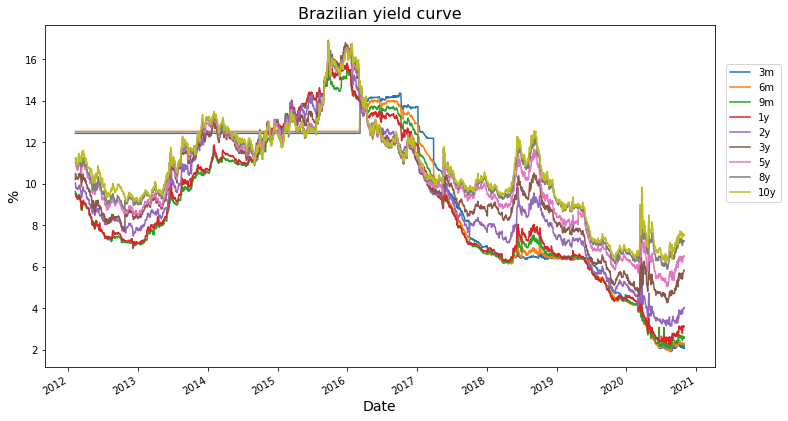

In [400]:
df_graph = df.copy()
df_graph.index = df_graph['Date']
df_graph = df_graph.drop(['Date'], axis = 1)
df_graph.plot(figsize = (12,7))
plt.title('Brazilian yield curve', fontsize = 16)
plt.legend(bbox_to_anchor=(1.01, .9), loc = 2)
plt.ylabel('%', fontsize = 14)
plt.xlabel('Date', fontsize = 14)



In [401]:
fig = px.line(df, x = 'Date', y = df.columns,
             labels = {'DATA': 'Date',
                       'value': 'Percent',
                       'variable': ''},
              title = 'Brazilian yield curve')

fig.show()

In [402]:
df_adj = df.copy() #ajustando 3m e 6m

### Como pudemos perceber, as taxas curtas de 3m e 6m só passam a variar a partir de 2016. Há algum problema com a fonte de dados. Sendo assim, iremos aplicar um filtro e substituir os valores para trás como NaN's.

In [403]:
df_adj['3m'] = np.where(df['Date'] <= datetime(2016, 3, 7), np.nan, df_adj['3m'])
df_adj['6m'] = np.where(df['Date'] <= datetime(2016, 3, 7), np.nan, df_adj['6m'])

Text(0.5, 0, 'Date')

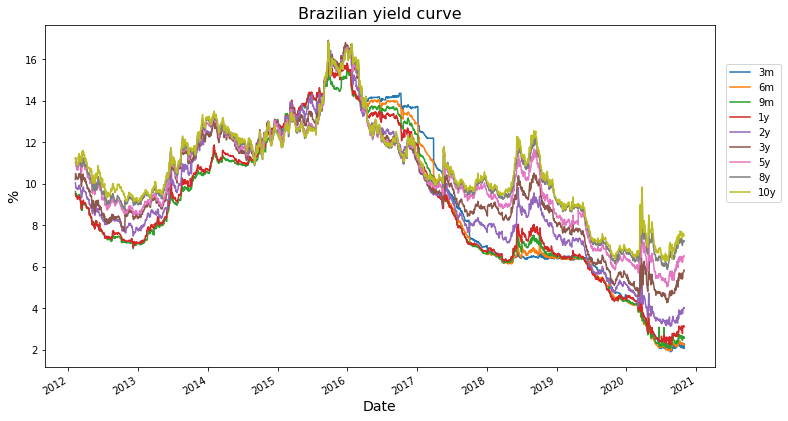

In [404]:
df_graph = df_adj.copy()
df_graph.index = df_graph['Date']
df_graph = df_graph.drop(['Date'], axis = 1)
df_graph.plot(figsize = (12,7))
plt.title('Brazilian yield curve', fontsize = 16)
plt.legend(bbox_to_anchor=(1.01, .9), loc = 2)
plt.ylabel('%', fontsize = 14)
plt.xlabel('Date', fontsize = 14)


In [405]:
fig = px.line(df_adj, x = 'Date', y = df.columns,
             labels = {'DATA': 'Date',
                       'value': 'Percent',
                       'variable': ''},
              title = 'Brazilian yield curve')

fig.show()

### Interpolando as curvas para obter taxas intermediárias

In [406]:
#função para transformar maturidade em valor
def get_tenor(x):
    
    string = str(x)
    
    if string[-1] == 'm':
        string1 = string
        string1 = string1[0:len(string1)-1]
        string1 = float(string1)
        string1 = string1/12

    elif string[-1] == 'y':
        string1 = string
        string1 = string1[0:len(string1)-1]
        string1 = float(string1)
        string1 = string1/1

    else: string1 = 'Inserir maturidade válida em mês (m) ou ano (y)'
    
    return(string1)

In [407]:
df

,Date,3m,6m,9m,1y,2y,3y,5y,8y,10y
524,2012-02-07,12.428,12.520,9.620,9.500,10.040,10.200,11.02,11.210,11.22
525,2012-02-08,12.428,12.520,9.540,9.480,9.960,10.490,11.03,11.210,11.25
526,2012-02-09,12.428,12.520,9.480,9.400,9.840,10.400,10.97,11.240,11.20
527,2012-02-10,12.428,12.520,9.470,9.380,9.780,10.310,10.83,11.071,11.03
528,2012-02-13,12.428,12.520,9.510,9.420,9.820,10.330,10.82,11.039,11.02
...,...,...,...,...,...,...,...,...,...,...
2854,2020-10-23,2.300,2.275,2.635,3.135,3.965,5.700,6.40,7.255,7.60
2855,2020-10-26,2.080,2.260,2.605,3.135,3.965,5.730,6.44,7.200,7.59
2856,2020-10-27,2.300,2.260,2.600,3.125,3.995,5.800,6.53,7.255,7.57
2857,2020-10-28,2.090,2.270,2.625,3.150,4.035,5.835,6.53,7.255,7.48


In [408]:
colunas = df.columns[1:]
df_pivot = df.melt(id_vars = ['Date'], value_vars = colunas) #transformando df de long para versão pivotada
df_pivot['value'] = df_pivot['value'] / 100
df_pivot['variable'] = df_pivot['variable'].apply(lambda x: get_tenor(x))
df_agg = df_pivot.groupby(['Date']).agg(lambda x: list(x)).reset_index() #agregando df, cada celula sera um colapsado agrupado por dia das maturidades e taxas

In [409]:
df_agg.head(10)

,Date,variable,value
0,2012-02-07,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.0962, 0.095, 0.10039999999..."
1,2012-02-08,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.09539999999999998, 0.09480..."
2,2012-02-09,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.09480000000000001, 0.094, ..."
3,2012-02-10,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.0947, 0.09380000000000001,..."
4,2012-02-13,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.0951, 0.0942, 0.0982000000..."
5,2012-02-14,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.0947, 0.09359999999999999,..."
6,2012-02-15,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.0943, 0.09359999999999999,..."
7,2012-02-16,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.09390000000000001, 0.0931,..."
8,2012-02-17,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.0935, 0.0925, 0.0972000000..."
9,2012-02-19,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.0935, 0.0925, 0.0972000000..."


In [410]:
def get_nss_params(tenors, yields, tau0 = [1,1]):
    t_original = np.array(tenors)
    y_original = np.array(yields)
    
    try:
        curve, status = calibrate_nss_ols(t_original, y_original, tau0 = tau0)
    except:
        curve, status = np.nan, np.nan
    
    params = str(curve)
    params = params.replace('NelsonSiegelSvenssonCurve', '')
    params = params.replace('(', '')
    params = params.replace(')', '')
    params = params.replace('beta0=', '')
    params = params.replace('beta1=', '')
    params = params.replace('beta2=', '')
    params = params.replace('beta3=', '')
    params = params.replace('tau1=', '')
    params = params.replace('tau2=', '')
    result = [x.strip() for x in params.split(',')]
    result = [float(x) for x in result]

    try:
        beta0 = result[0]
        beta1 = result[1]
        beta2 = result[2]
        beta3 = result[3]
        tau1 = result[4]
        tau2 = result[5]
        
        nss = NelsonSiegelSvenssonCurve(beta0, beta1, beta2, beta3, tau1, tau2)
        t = np.arange(1,121,1)
        t = [element / 12 for element in t]
        t = np.array(t)
        fitted_yields = nss(t)
   
    except:
        fitted_yields = np.nan
        

    

    return(result, fitted_yields)

In [411]:
df_agg['nss_result'] = df_agg.apply(lambda x: get_nss_params(x['variable'], x['value'])[1], axis =1 )


C:\Users\Pichau\anaconda3\lib\site-packages\nelson_siegel_svensson\nss.py:42: RuntimeWarning:

overflow encountered in exp

C:\Users\Pichau\anaconda3\lib\site-packages\nelson_siegel_svensson\nss.py:45: RuntimeWarning:

invalid value encountered in subtract

C:\Users\Pichau\anaconda3\lib\site-packages\nelson_siegel_svensson\nss.py:43: RuntimeWarning:

overflow encountered in exp

C:\Users\Pichau\anaconda3\lib\site-packages\nelson_siegel_svensson\nss.py:46: RuntimeWarning:

invalid value encountered in subtract



In [412]:
df_agg

,Date,variable,value,nss_result
0,2012-02-07,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.0962, 0.095, 0.10039999999...","[0.1439622517191097, 0.1357317088850154, 0.128..."
1,2012-02-08,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.09539999999999998, 0.09480...","[0.14461708068847656, 0.13620376586914062, 0.1..."
2,2012-02-09,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.09480000000000001, 0.094, ...","[0.14552640914916992, 0.13660907745361328, 0.1..."
3,2012-02-10,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.0947, 0.09380000000000001,...","[0.145444281129256, 0.13660872544776925, 0.128..."
4,2012-02-13,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.12428, 0.1252, 0.0951, 0.0942, 0.0982000000...","[0.1451735496520996, 0.13637733459472656, 0.12..."
...,...,...,...,...
2330,2020-10-23,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.023, 0.02275, 0.02635, 0.031349999999999996...","[0.022668421268463135, 0.022526144981384277, 0..."
2331,2020-10-26,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.0208, 0.0226, 0.02605, 0.031349999999999996...","[0.01759157334339194, 0.018687386708561834, 0...."
2332,2020-10-27,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.023, 0.0226, 0.026000000000000002, 0.03125,...","[0.02332282066345215, 0.022877931594848633, 0...."
2333,2020-10-28,"[0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 5.0, 8.0, 10.0]","[0.0209, 0.0227, 0.02625, 0.0315, 0.0403500000...","[0.01697530384083365, 0.018258137215785078, 0...."


In [413]:
df_complete = df_agg['nss_result'].apply(pd.Series)

In [414]:
t = np.arange(1,121,1)
df_complete.columns = t

In [415]:
df_complete = df_complete*100
df_complete['Date'] = df_agg['Date']

In [416]:
df_original = df.copy()
colunas = df_original.columns[1:]
colunas = [get_tenor(x)*12 for x in colunas] #transformando os elementos da coluna em mês
colunas.insert(0, 'Date')
df_original.columns = colunas


In [417]:
df_original.head(10)

,Date,3.0,6.0,9.0,12.0,24.0,36.0,60.0,96.0,120.0
524,2012-02-07,12.428,12.52,9.62,9.50,10.04,10.20,11.02,11.210,11.22
525,2012-02-08,12.428,12.52,9.54,9.48,9.96,10.49,11.03,11.210,11.25
526,2012-02-09,12.428,12.52,9.48,9.40,9.84,10.40,10.97,11.240,11.20
527,2012-02-10,12.428,12.52,9.47,9.38,9.78,10.31,10.83,11.071,11.03
528,2012-02-13,12.428,12.52,9.51,9.42,9.82,10.33,10.82,11.039,11.02
529,2012-02-14,12.428,12.52,9.47,9.36,9.80,10.27,10.70,10.950,10.92
530,2012-02-15,12.428,12.52,9.43,9.36,9.80,10.28,10.68,10.910,10.91
531,2012-02-16,12.428,12.52,9.39,9.31,9.75,10.25,10.70,10.900,10.93
532,2012-02-17,12.428,12.52,9.35,9.25,9.72,10.22,10.66,10.815,10.89
533,2012-02-19,12.428,12.52,9.35,9.25,9.72,10.22,10.66,10.815,10.89


In [418]:
df_complete.head(10)

,1,2,3,4,5,6,7,8,9,10,...,112,113,114,115,116,117,118,119,120,Date
0,14.396225,13.573171,12.862762,12.252208,11.730041,11.285992,10.910872,10.596460,10.335411,10.121169,...,11.209343,11.208872,11.208384,11.207881,11.207365,11.206837,11.206298,11.205750,11.205195,2012-02-07
1,14.461708,13.620377,12.879562,12.248993,11.703491,11.248779,10.856628,10.537720,10.276031,10.062408,...,11.204147,11.202240,11.199570,11.197281,11.195755,11.193466,11.191559,11.189651,11.187744,2012-02-08
2,14.552641,13.660908,12.900639,12.247086,11.689186,11.220932,10.823822,10.492897,10.218620,9.997940,...,11.194134,11.192513,11.190796,11.189556,11.187935,11.186409,11.184883,11.183357,11.181641,2012-02-09
3,14.544428,13.660873,12.899669,12.246794,11.689688,11.217113,10.819015,10.486413,10.211288,9.986488,...,11.022593,11.020689,11.018789,11.016894,11.015006,11.013126,11.011256,11.009396,11.007548,2012-02-10
4,14.517355,13.637733,12.890244,12.247658,11.699867,11.235046,10.840607,10.514069,10.241699,10.020828,...,11.000729,10.998821,10.996723,10.994625,10.992527,10.990524,10.988522,10.986710,10.984802,2012-02-13
5,14.520332,13.644259,12.889224,12.241350,11.688211,11.218685,10.822826,10.491749,10.217521,9.993067,...,10.896446,10.894167,10.891899,10.889642,10.887398,10.885169,10.882955,10.880758,10.878577,2012-02-14
6,14.517975,13.643265,12.885475,12.235260,11.682510,11.209106,10.808182,10.477448,10.202026,9.977722,...,10.867691,10.865593,10.862541,10.860443,10.857773,10.855103,10.852814,10.850525,10.848045,2012-02-15
7,14.567704,13.670583,12.897730,12.234880,11.669255,11.189425,10.785168,10.447352,10.167825,9.939320,...,10.880858,10.878414,10.875982,10.873565,10.871162,10.868776,10.866407,10.864056,10.861724,2012-02-16
8,13.245231,12.767892,12.339457,11.955587,11.612310,11.305991,11.033304,10.791206,10.576917,10.387890,...,11.190046,11.199912,11.209611,11.219147,11.228523,11.237744,11.246812,11.255733,11.264508,2012-02-17
9,13.245231,12.767892,12.339457,11.955587,11.612310,11.305991,11.033304,10.791206,10.576917,10.387890,...,11.190046,11.199912,11.209611,11.219147,11.228523,11.237744,11.246812,11.255733,11.264508,2012-02-19


In [419]:
#filtrando os dois df com datas acima de 3 de julho de 2016
df_complete = df_complete[df_complete['Date'] >= datetime(2016, 3, 7) ]
df_original = df_original[df_original['Date'] >= datetime(2016, 3, 7) ] 


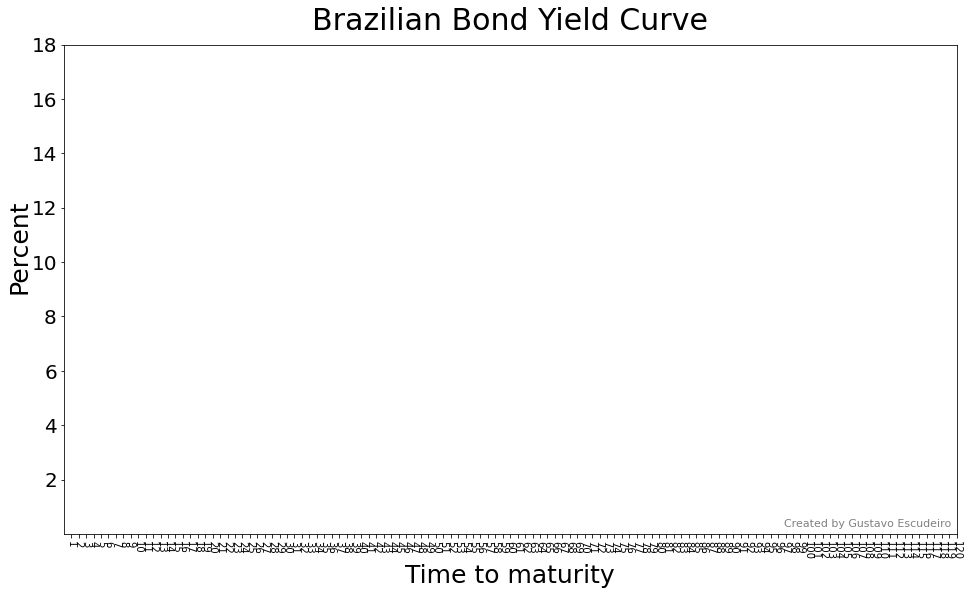

In [420]:
# Initialize figure
fig = plt.figure(figsize=(16,9))
ax = fig.add_subplot(1, 1, 1)
t = np.arange(1, 121, 1)
line1, = ax.plot([], [], lw=len(t))
line2, = ax.plot([], [], 'bo', lw=len(colunas[1:]))

ax.grid()

ax.set_xlim(0,7)
ax.set_ylim(0,18)

ax.set_xticks(t)
ax.set_yticks([2,4,6,8,10,12,14,16,18])
plt.xticks(rotation=-90) 

xlabels = np.arange(1, 121, 1)
ylabels = [2,4,6,8,10,12,14,16,18]

#ax.set_xticklabels(xlabels,fontsize=20)
ax.set_yticklabels(ylabels,fontsize=20)

figure_title = 'Brazilian Bond Yield Curve'
figure_xlabel = 'Time to maturity'
figure_ylabel = 'Percent'

ax.grid(False)

plt.text(0.5, 1.03, figure_title,horizontalalignment='center',fontsize=30,transform = ax.transAxes)
plt.text(0.5, -.1, figure_xlabel,horizontalalignment='center',fontsize=25,transform = ax.transAxes)
plt.text(-0.05, .5, figure_ylabel,horizontalalignment='center',fontsize=25,rotation='vertical',transform = ax.transAxes)

ax.text(6.45*15,.25, 'Created by Gustavo Escudeiro',fontsize=11, color='black',alpha=0.5)#,
#dateText = ax.text(0.975, 16.625, '',fontsize=18,horizontalalignment='right')
#dia = ax.annotate(data, xy=(2, 1), xytext=(0.1, 16.1))
#dia.set_fontsize(20)
dateText = ax.text(15, 17, '',fontsize=18,horizontalalignment='right')

In [421]:
# Initialization function
def init_func():
    line1.set_data([], [])
    line1.set_linewidth(2) #expessura da linha
    line1.set_color('#0206ed')
    
    line2.set_data([], [])
    line2.set_color('#eb6f02')
    
    return line1, line2,

In [422]:
# The animation function
def animate(i):
    global df_complete, df_original
    x = t
    y = df_complete[t].iloc[i]
    line1.set_data(x, y)
    
    z = colunas[1:]
    w = df_original[z].iloc[i]
    line2.set_data(z, w)
    
    
    #dateText.set_text(df.index[i].strftime('%b %d, %Y'))
    dateText.set_text(str(pd.to_datetime(df_complete['Date'].iloc[i]).date()))
    #data = pd.to_datetime(df['Date'].iloc[i])
    return line1 , line2, dateText

In [423]:
# Make the animation
N = len(df_complete.index)
anim = animation.FuncAnimation(fig, animate, init_func=init_func,frames=N)
#anim = animation.FuncAnimation(fig, animate, init_func=init_func,frames=N, interval=20, blit=True)

In [424]:
anim.save('yield_curvet.gif', writer = "pillow", fps=40 )

In [476]:
fig = go.Figure(data=[go.Surface(z=df_complete[t], y=df_complete['Date'], x = t)])
fig.update_scenes(xaxis_autorange='reversed')

fig.update_layout(scene =  dict(
                            xaxis_title = 'Maturidade (meses)',
                            yaxis_title = 'Data',
                            zaxis_title = '%'),
                            width = 1000,
                            height = 1000,
                            
                 title = 'Brazilian Bond Yield Curve Surface')

fig.show()

In [ ]:
clip = mp.VideoFileClip("yield_curve.gif")
clip.write_videofile("yield_curve.mp4")